In [23]:
from scripts.db import *
from scripts.plots import *
from scripts.stats import *
import numpy as np  
import pandas as pd  
import matplotlib.pyplot as plt  
%matplotlib inline
from sklearn import linear_model
import os
import json

In [2]:
users, db = dataProcesada()

In [24]:
data = db
data = data[['alias', 'userId', 'EnvioInstance','Finalizado', 'OrientacionEntrenamiento', 'Refrencia', 'faseActiva','identificadorNivel', 'levelInstance', 'sessionInstance', 'AnguloFijo','Desviacion', 'IdEstimulo', 'NivelSenalDinamica', 'NivelSenalEstimulo', 'RtaCorrecta','TipoDeTrial']]
data = data[data['faseActiva']!='Tutorial']


mapNames = {'ExpT_Marco':'Sujeto01','ExpT_Carolina':'Sujeto02','ExpT_Magdalena':'Sujeto03','ExpT_Ivan':'Sujeto04','ExpT_Enzo':'Sujeto05',
            'ExpT_Julieta':'Sujeto06','ExpT_Gaston':'Sujeto07','ExpT_Andres':'Sujeto08','ExpT_CaroG':'Sujeto09','ExpT_Michelle':'Sujeto10'}

data['sujetos'] = data['alias'].map(mapNames)
#Datos perdidos
# Carolina primer test entrenamiento
# Magdalena primer entrenamiento ultimo dia
# Enzo primero del segundo dia

# Vamos a cargar los datos de Carolina
with open('./Paper/DatosTransferencia/1472739152992_Carolina.log') as data_file:    
    dattJson = json.load(data_file)


ValueError: Expecting property name enclosed in double quotes: line 1 column 2 (char 1)

Vamos a hacer un analisis sujeto por sujeto

In [4]:
# Sujeto 1

# Filtramos la data

dataS = data[data['sujetos']=='Sujeto01']

# El sujeto 1 entreno en agulos
levels = dataS['levelInstance'].unique()

levelsAProcesar= [levels[4],levels[8],levels[9],levels[10],levels[11],levels[12],levels[13],levels[14],levels[15],levels[16],levels[17],levels[18],levels[19],levels[24]]

AMax = 79.6
N = 200
paso=AMax/N

dataConjunta = pd.DataFrame()

for level in levelsAProcesar:
    dataP = data[data['levelInstance']==level]
    dataP['medida'] = (dataP['NivelSenalDinamica']+1)*paso
    if len (dataConjunta)>0: 
        dataConjunta = pd.concat([dataConjunta,dataP])
    else:
        dataConjunta = dataP

/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


/usr/lib/python3/dist-packages/matplotlib/collections.py:549: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == 'face':
/usr/lib/python3/dist-packages/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


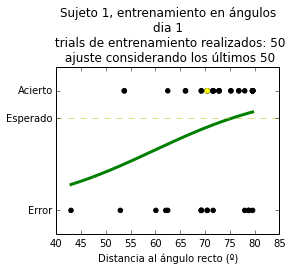

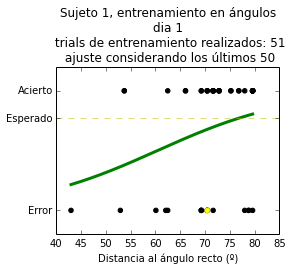

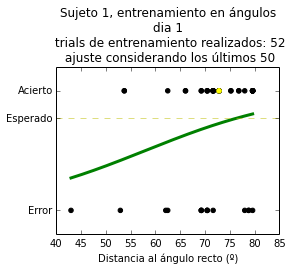

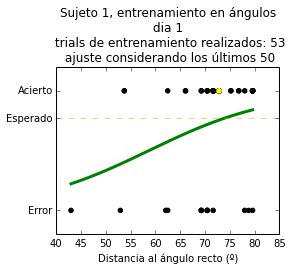

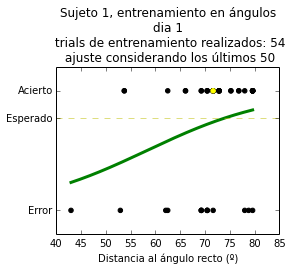

...

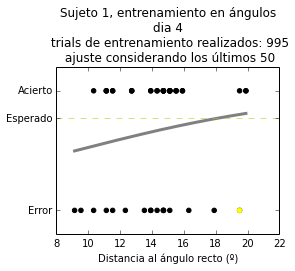

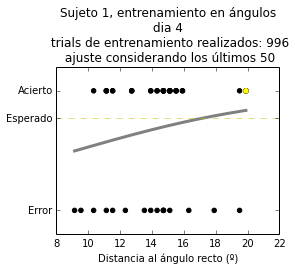

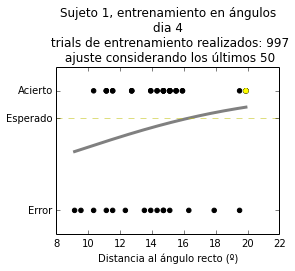

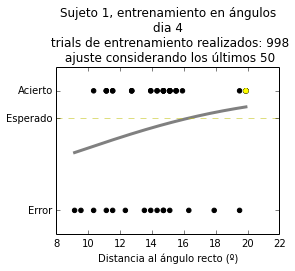

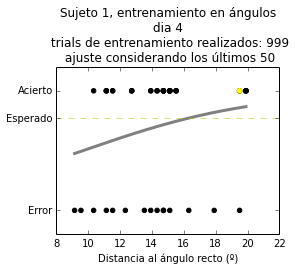

In [20]:
mapColor = {'TestInicial':'black', 'Entrenamiento1':'green', 'Entrenamiento2':'red', 'Entrenamiento3':'blue',
       'Entrenamiento4':'gray', 'TestFinal':'black'}


vmin=30

ventana = 50

TestInicial = False
Sesiones = 4
TestFinal = False

if TestInicial:
    inicio=0
else:
    inicio = 40
    
if TestFinal:
    final=1080
else:
    final=40+Sesiones*250



def model(x):
    return 1 / (1 + np.exp(-x))


for i in np.arange(inicio,final):
    
    if ventana < 0:
        if i-inicio<vmin:
            continue
        else:
            Ni=inicio
            Nf=i
    else:
        if i-ventana < inicio:
            continue
        else:
            Ni=i-ventana
            Nf=i
    
    
    
    X = np.array(dataConjunta["medida"])[Ni:Nf, np.newaxis]
    y = np.array(dataConjunta["RtaCorrecta"].astype(float))[Ni:Nf]

    clf = linear_model.LogisticRegression(C=1e5)
    clf.fit(X, y)

    # and plot the result
    fig, ax = plt.subplots(1,1,figsize=(4, 3))
    if ventana>0:
        ax.set_title('Sujeto 1, entrenamiento en ángulos \n' + 'dia '+dataConjunta['faseActiva'].iloc[Nf-1][-1]+'\n trials de entrenamiento realizados: '+ str(Nf-40)+' \n ajuste considerando los últimos '+str(ventana))
    else:
        ax.set_title('Sujeto 1, entrenamiento en ángulos \n' + 'dia '+dataConjunta['faseActiva'].iloc[Nf-1][-1]+'\n trials de entrenamiento realizados: '+ str(Nf-40))
    ax.scatter(X, y, color='black', zorder=20)
    ax.scatter(X[-1], y[-1], color='yellow', zorder=20)
    X_test = np.linspace(min(X), max(X), 300)

    loss = model(X_test * clf.coef_ + clf.intercept_).ravel()
    ax.plot(X_test, loss, color=mapColor[dataConjunta['faseActiva'].iloc[Nf-1]], linewidth=3)

    ax.axhline(y=0.77,linewidth=0.5, color='y', linestyle='dashed')
    ax.set_xlabel('Distancia al ángulo recto (º)')
    ax.set_yticks([0,0.77,1]) 
    ax.set_yticklabels(['Error','Esperado','Acierto'])
    
    directory = './Series/'+dataConjunta.iloc[0]['sujetos']+'_ventana_'+str(ventana)+'rango:'
    if not os.path.exists(directory):
        os.makedirs(directory)
    plt.savefig(directory+'/img'+str(i)+'.png', dpi=300, bbox_inches='tight')
    

In [12]:
dataConjunta.head()

,alias,userId,EnvioInstance,Finalizado,OrientacionEntrenamiento,Refrencia,faseActiva,identificadorNivel,levelInstance,sessionInstance,AnguloFijo,Desviacion,IdEstimulo,NivelSenalDinamica,NivelSenalEstimulo,RtaCorrecta,TipoDeTrial,sujetos,medida
180,ExpT_Marco,1472655943097,1472658436526,True,A30,30,TestInicial,TESTA30,1472658124630,1472657076769,35.0,-10.395,1769,199,200,True,Estimulo,Sujeto01,79.600
181,ExpT_Marco,1472655943097,1472658436526,True,A30,30,TestInicial,TESTA30,1472658124630,1472657076769,30.0,-90.000,8170,153,0,False,NoEstimulo,Sujeto01,61.292
182,ExpT_Marco,1472655943097,1472658436526,True,A30,30,TestInicial,TESTA30,1472658124630,1472657076769,30.0,-11.975,565,195,196,False,Estimulo,Sujeto01,78.008
183,ExpT_Marco,1472655943097,1472658436526,True,A30,30,TestInicial,TESTA30,1472658124630,1472657076769,23.0,-90.000,8184,199,0,False,NoEstimulo,Sujeto01,79.600
184,ExpT_Marco,1472655943097,1472658436526,True,A30,30,TestInicial,TESTA30,1472658124630,1472657076769,21.0,-90.000,8188,199,0,False,NoEstimulo,Sujeto01,79.600


In [26]:
clf.predict_proba(X)
x = np.arange(0,80)[:, np.newaxis]
resultado = clf.predict_proba(x)

len (resultado)

80

In [42]:
min(X)

array([ 42.984])

In [25]:
datosCaro = {origen:ENTRENAMIENTOA30INICIAL,estadoEnvio:ENVIADO,instance:1472739152992,objeto:{class:com.turin.tur.main.levelsDesign.LevelUmbral$LogConvergencia,levelLog:{sesion:{user:{id:1472735163595,faseDeExperimentoActiva:Entrenamiento1,levelsJugados:[{identificador:Ejemplos,contexto:Tutorial,Instance:1472735892582,desviacionAlFinalizar:-1,nivelAlFinalizar:-1},{identificador:ParalelismoTutorial,contexto:Tutorial,Instance:1472736020818,desviacionAlFinalizar:0,nivelAlFinalizar:19},{identificador:AngulosTutorial,contexto:Tutorial,Instance:1472736081977,desviacionAlFinalizar:29.75,nivelAlFinalizar:15},{identificador:TESTP30,contexto:TestInicial,Instance:1472736485478,desviacionAlFinalizar:0,nivelAlFinalizar:109},{identificador:TESTP60,contexto:TestInicial,Instance:1472736780517,desviacionAlFinalizar:-9.830499999999999,nivelAlFinalizar:39},{identificador:TESTP120,contexto:TestInicial,Instance:1472737018137,desviacionAlFinalizar:-35.03,nivelAlFinalizar:140},{identificador:TESTP150,contexto:TestInicial,Instance:1472737322421,desviacionAlFinalizar:0,nivelAlFinalizar:75},{identificador:TESTA30,contexto:TestInicial,Instance:1472737632270,desviacionAlFinalizar:-168.025,nivelAlFinalizar:195},{identificador:TESTA60,contexto:TestInicial,Instance:1472737947247,desviacionAlFinalizar:-166.05,nivelAlFinalizar:190},{identificador:TESTA120,contexto:TestInicial,Instance:1472738305659,desviacionAlFinalizar:30.144999999999996,nivelAlFinalizar:149},{identificador:TESTA150,contexto:TestInicial,Instance:1472738516358,desviacionAlFinalizar:66.88,nivelAlFinalizar:56}],eleccion:A30},sessionInstance:1472735915319,codeVersion:42,resourcesVersion:42,plataforma:Desktop},identificadorNivel:ENTRENAMIENTOA30INICIAL,instance:1472738524843},dinamica:{estimuloActivo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:32,desviacion:-90,idResource:8173,idTrial:18327,nivelSenal:0,anguloLadoMovil:-58},pseudorandom:[{confiance:false,trialType:Estimulo},{confiance:false,trialType:Estimulo},{confiance:true,trialType:Test},{confiance:false,trialType:Estimulo},{confiance:false,trialType:NoEstimulo},{confiance:false,trialType:Estimulo},{confiance:false,trialType:Estimulo},{confiance:false,trialType:NoEstimulo},{confiance:true,trialType:NoEstimulo},{confiance:true,trialType:Estimulo},{confiance:false,trialType:Estimulo},{confiance:true,trialType:NoEstimulo},{confiance:false,trialType:Estimulo},{confiance:false,trialType:Estimulo},{confiance:false,trialType:NoEstimulo},{confiance:false,trialType:NoEstimulo},{confiance:true,trialType:NoEstimulo},{confiance:true,trialType:Estimulo},{confiance:true,trialType:Estimulo},{confiance:false,trialType:Estimulo},{confiance:false,trialType:NoEstimulo},{confiance:true,trialType:NoEstimulo},{confiance:false,trialType:Estimulo},{confiance:false,trialType:Estimulo},{confiance:false,trialType:Estimulo},{confiance:false,trialType:Estimulo},{confiance:false,trialType:NoEstimulo},{confiance:false,trialType:NoEstimulo},{confiance:false,trialType:NoEstimulo},{confiance:true,trialType:Estimulo},{confiance:false,trialType:NoEstimulo},{confiance:false,trialType:NoEstimulo},{confiance:false,trialType:Estimulo},{confiance:false,trialType:Estimulo},{confiance:false,trialType:NoEstimulo},{confiance:false,trialType:NoEstimulo},{confiance:false,trialType:Estimulo},{confiance:false,trialType:Estimulo},{confiance:false,trialType:Estimulo},{confiance:false,trialType:NoEstimulo},{confiance:false,trialType:Estimulo},{confiance:true,trialType:NoEstimulo},{confiance:false,trialType:Estimulo},{confiance:true,trialType:Estimulo},{confiance:false,trialType:NoEstimulo},{confiance:true,trialType:NoEstimulo},{confiance:false,trialType:NoEstimulo},{confiance:false,trialType:NoEstimulo},{confiance:false,trialType:NoEstimulo},{confiance:true,trialType:NoEstimulo},{confiance:true,trialType:Estimulo},{confiance:true,trialType:Estimulo},{confiance:true,trialType:Test},{confiance:false,trialType:NoEstimulo},{confiance:false,trialType:NoEstimulo},{confiance:true,trialType:NoEstimulo},{confiance:false,trialType:NoEstimulo},{confiance:false,trialType:NoEstimulo},{confiance:true,trialType:Estimulo},{confiance:false,trialType:Estimulo},{confiance:true,trialType:Estimulo},{confiance:false,trialType:NoEstimulo},{confiance:true,trialType:NoEstimulo},{confiance:false,trialType:Estimulo},{confiance:false,trialType:NoEstimulo},{confiance:false,trialType:NoEstimulo},{confiance:true,trialType:NoEstimulo},{confiance:false,trialType:Estimulo},{confiance:false,trialType:Estimulo},{confiance:false,trialType:Estimulo},{confiance:true,trialType:Test},{confiance:true,trialType:Test},{confiance:false,trialType:NoEstimulo},{confiance:true,trialType:Estimulo},{confiance:false,trialType:Estimulo},{confiance:true,trialType:Estimulo},{confiance:false,trialType:NoEstimulo},{confiance:true,trialType:NoEstimulo},{confiance:true,trialType:Test},{confiance:true,trialType:NoEstimulo},{confiance:false,trialType:NoEstimulo},{confiance:false,trialType:Estimulo},{confiance:true,trialType:Estimulo},{confiance:false,trialType:Estimulo},{confiance:false,trialType:Estimulo},{confiance:false,trialType:NoEstimulo},{confiance:true,trialType:Estimulo},{confiance:true,trialType:Test},{confiance:false,trialType:Estimulo},{confiance:false,trialType:NoEstimulo},{confiance:false,trialType:NoEstimulo},{confiance:true,trialType:Test},{confiance:false,trialType:Estimulo},{confiance:true,trialType:Test},{confiance:false,trialType:NoEstimulo},{confiance:true,trialType:Test},{confiance:true,trialType:NoEstimulo},{confiance:false,trialType:Estimulo},{confiance:true,trialType:Test},{confiance:false,trialType:NoEstimulo}],estimulosCeros:[],historial:[{acertado:true,confianceTimeInTrial:0,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:32.5,desviacion:-169.60500000000002,idResource:570,idTrial:16722,nivelSenal:200,anguloLadoMovil:-137.10500000000002},nivelEstimulo:199,selectionTimeInTrial:8.079601,soundLoops:2,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:32.5,desviacion:-29.75,idResource:920,idTrial:17072,nivelSenal:151,anguloLadoMovil:2.75},nivelEstimulo:150,selectionTimeInTrial:6.275163,soundLoops:1,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:35,desviacion:-169.60500000000002,idResource:1370,idTrial:17522,nivelSenal:200,anguloLadoMovil:-134.60500000000002},nivelEstimulo:103,selectionTimeInTrial:7.590624,soundLoops:2,trialType:Test},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:25,desviacion:-131.685,idResource:1866,idTrial:18019,nivelSenal:104,anguloLadoMovil:-106.685},nivelEstimulo:103,selectionTimeInTrial:5.0602503,soundLoops:1,trialType:Estimulo},{acertado:false,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:23,desviacion:-90,idResource:8184,idTrial:18338,nivelSenal:0,anguloLadoMovil:-67},nivelEstimulo:59,selectionTimeInTrial:3.7784276,soundLoops:1,trialType:NoEstimulo},{acertado:false,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:32.5,desviacion:-130.895,idResource:668,idTrial:16820,nivelSenal:102,anguloLadoMovil:-98.39500000000001},nivelEstimulo:101,selectionTimeInTrial:5.5665097,soundLoops:1,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:30,desviacion:-146.695,idResource:228,idTrial:16379,nivelSenal:142,anguloLadoMovil:-116.695},nivelEstimulo:141,selectionTimeInTrial:4.73972,soundLoops:1,trialType:Estimulo},{acertado:false,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:36,desviacion:-90,idResource:8181,idTrial:18335,nivelSenal:0,anguloLadoMovil:-54},nivelEstimulo:102,selectionTimeInTrial:5.245974,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:30,desviacion:-90,idResource:8170,idTrial:18324,nivelSenal:0,anguloLadoMovil:-60},nivelEstimulo:139,selectionTimeInTrial:7.9283304,soundLoops:2,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:30,desviacion:-145.905,idResource:230,idTrial:16381,nivelSenal:140,anguloLadoMovil:-115.905},nivelEstimulo:139,selectionTimeInTrial:4.7230406,soundLoops:1,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:25,desviacion:-132.475,idResource:1864,idTrial:18017,nivelSenal:106,anguloLadoMovil:-107.475},nivelEstimulo:105,selectionTimeInTrial:4.6892986,soundLoops:1,trialType:Estimulo},{acertado:false,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:36,desviacion:-90,idResource:8181,idTrial:18335,nivelSenal:0,anguloLadoMovil:-54},nivelEstimulo:105,selectionTimeInTrial:5.026524,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:25,desviacion:-144.72,idResource:1833,idTrial:17986,nivelSenal:137,anguloLadoMovil:-119.72},nivelEstimulo:136,selectionTimeInTrial:4.5209107,soundLoops:1,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:25,desviacion:-35.28,idResource:2106,idTrial:18259,nivelSenal:137,anguloLadoMovil:-10.280000000000001},nivelEstimulo:136,selectionTimeInTrial:5.5663586,soundLoops:1,trialType:Estimulo},{acertado:false,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:35,desviacion:-90,idResource:8179,idTrial:18333,nivelSenal:0,anguloLadoMovil:-55},nivelEstimulo:109,selectionTimeInTrial:4.6892996,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:33,desviacion:-90,idResource:8175,idTrial:18329,nivelSenal:0,anguloLadoMovil:-57},nivelEstimulo:134,selectionTimeInTrial:11.082348,soundLoops:2,trialType:NoEstimulo},{acertado:false,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:25,desviacion:-90,idResource:8180,idTrial:18334,nivelSenal:0,anguloLadoMovil:-65},nivelEstimulo:134,selectionTimeInTrial:6.156957,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:35,desviacion:-152.62,idResource:1413,idTrial:17565,nivelSenal:157,anguloLadoMovil:-117.62},nivelEstimulo:156,selectionTimeInTrial:5.51606,soundLoops:1,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:27.5,desviacion:-27.379999999999995,idResource:1326,idTrial:17478,nivelSenal:157,anguloLadoMovil:0.12000000000000455},nivelEstimulo:156,selectionTimeInTrial:9.648544,soundLoops:2,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:27.5,desviacion:-34.885,idResource:1307,idTrial:17459,nivelSenal:138,anguloLadoMovil:-7.384999999999998},nivelEstimulo:137,selectionTimeInTrial:3.93025,soundLoops:1,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:36,desviacion:-90,idResource:8181,idTrial:18335,nivelSenal:0,anguloLadoMovil:-54},nivelEstimulo:137,selectionTimeInTrial:6.2244754,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:22,desviacion:-90,idResource:8186,idTrial:18340,nivelSenal:0,anguloLadoMovil:-68},nivelEstimulo:121,selectionTimeInTrial:4.5032644,soundLoops:1,trialType:NoEstimulo},{acertado:false,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:35,desviacion:-138.79500000000002,idResource:1448,idTrial:17600,nivelSenal:122,anguloLadoMovil:-103.79500000000002},nivelEstimulo:121,selectionTimeInTrial:6.308623,soundLoops:1,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:27.5,desviacion:-36.464999999999996,idResource:1303,idTrial:17455,nivelSenal:134,anguloLadoMovil:-8.964999999999996},nivelEstimulo:133,selectionTimeInTrial:4.2338915,soundLoops:1,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:30,desviacion:-36.464999999999996,idResource:503,idTrial:16654,nivelSenal:134,anguloLadoMovil:-6.464999999999996},nivelEstimulo:133,selectionTimeInTrial:4.6217284,soundLoops:1,trialType:Estimulo},{acertado:false,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:35,desviacion:-139.98000000000002,idResource:1445,idTrial:17597,nivelSenal:125,anguloLadoMovil:-104.98000000000002},nivelEstimulo:124,selectionTimeInTrial:4.1156855,soundLoops:1,trialType:Estimulo},{acertado:false,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:24,desviacion:-90,idResource:8182,idTrial:18336,nivelSenal:0,anguloLadoMovil:-66},nivelEstimulo:131,selectionTimeInTrial:5.3808293,soundLoops:1,trialType:NoEstimulo},{acertado:false,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:35,desviacion:-90,idResource:8179,idTrial:18333,nivelSenal:0,anguloLadoMovil:-55},nivelEstimulo:137,selectionTimeInTrial:3.9301603,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:28,desviacion:-90,idResource:8174,idTrial:18328,nivelSenal:0,anguloLadoMovil:-62},nivelEstimulo:141,selectionTimeInTrial:4.436254,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:32.5,desviacion:-146.695,idResource:628,idTrial:16780,nivelSenal:142,anguloLadoMovil:-114.195},nivelEstimulo:141,selectionTimeInTrial:5.9881854,soundLoops:1,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:27,desviacion:-90,idResource:8176,idTrial:18330,nivelSenal:0,anguloLadoMovil:-63},nivelEstimulo:138,selectionTimeInTrial:7.539924,soundLoops:2,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:32,desviacion:-90,idResource:8173,idTrial:18327,nivelSenal:0,anguloLadoMovil:-58},nivelEstimulo:138,selectionTimeInTrial:6.696745,soundLoops:1,trialType:NoEstimulo},{acertado:false,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:35,desviacion:-36.86,idResource:1702,idTrial:17854,nivelSenal:133,anguloLadoMovil:-1.8599999999999994},nivelEstimulo:132,selectionTimeInTrial:5.2623653,soundLoops:1,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:30,desviacion:-35.675,idResource:505,idTrial:16656,nivelSenal:136,anguloLadoMovil:-5.674999999999997},nivelEstimulo:135,selectionTimeInTrial:4.75678,soundLoops:1,trialType:Estimulo},{acertado:false,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:20,desviacion:-90,idResource:8190,idTrial:18344,nivelSenal:0,anguloLadoMovil:-70},nivelEstimulo:135,selectionTimeInTrial:3.7954028,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:35,desviacion:-90,idResource:8179,idTrial:18333,nivelSenal:0,anguloLadoMovil:-55},nivelEstimulo:141,selectionTimeInTrial:5.3809314,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:27.5,desviacion:-146.695,idResource:1028,idTrial:17180,nivelSenal:142,anguloLadoMovil:-119.195},nivelEstimulo:141,selectionTimeInTrial:3.980686,soundLoops:1,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:30,desviacion:-34.489999999999995,idResource:508,idTrial:16659,nivelSenal:139,anguloLadoMovil:-4.489999999999995},nivelEstimulo:138,selectionTimeInTrial:4.503883,soundLoops:1,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:25,desviacion:-145.51,idResource:1831,idTrial:17984,nivelSenal:139,anguloLadoMovil:-120.50999999999999},nivelEstimulo:138,selectionTimeInTrial:4.8750978,soundLoops:1,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:36,desviacion:-90,idResource:8181,idTrial:18335,nivelSenal:0,anguloLadoMovil:-54},nivelEstimulo:132,selectionTimeInTrial:6.2243176,soundLoops:1,trialType:NoEstimulo},{acertado:false,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:27.5,desviacion:-143.14,idResource:1037,idTrial:17189,nivelSenal:133,anguloLadoMovil:-115.63999999999999},nivelEstimulo:132,selectionTimeInTrial:6.730484,soundLoops:1,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:22,desviacion:-90,idResource:8186,idTrial:18340,nivelSenal:0,anguloLadoMovil:-68},nivelEstimulo:135,selectionTimeInTrial:7.1350694,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:32.5,desviacion:-35.675,idResource:905,idTrial:17057,nivelSenal:136,anguloLadoMovil:-3.174999999999997},nivelEstimulo:135,selectionTimeInTrial:5.2629886,soundLoops:1,trialType:Estimulo},{acertado:false,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:27.5,desviacion:-143.14,idResource:1037,idTrial:17189,nivelSenal:133,anguloLadoMovil:-115.63999999999999},nivelEstimulo:132,selectionTimeInTrial:8.3328495,soundLoops:2,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:36,desviacion:-90,idResource:8181,idTrial:18335,nivelSenal:0,anguloLadoMovil:-54},nivelEstimulo:135,selectionTimeInTrial:6.983193,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:32,desviacion:-90,idResource:8173,idTrial:18327,nivelSenal:0,anguloLadoMovil:-58},nivelEstimulo:135,selectionTimeInTrial:7.0846767,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:26,desviacion:-90,idResource:8178,idTrial:18332,nivelSenal:0,anguloLadoMovil:-64},nivelEstimulo:132,selectionTimeInTrial:6.881846,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:31,desviacion:-90,idResource:8171,idTrial:18325,nivelSenal:0,anguloLadoMovil:-59},nivelEstimulo:132,selectionTimeInTrial:5.212552,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:31,desviacion:-90,idResource:8171,idTrial:18325,nivelSenal:0,anguloLadoMovil:-59},nivelEstimulo:126,selectionTimeInTrial:4.9082537,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:29,desviacion:-90,idResource:8172,idTrial:18326,nivelSenal:0,anguloLadoMovil:-61},nivelEstimulo:126,selectionTimeInTrial:4.8072324,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:32.5,desviacion:-42.785,idResource:887,idTrial:17039,nivelSenal:118,anguloLadoMovil:-10.284999999999997},nivelEstimulo:117,selectionTimeInTrial:4.689527,soundLoops:1,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:30,desviacion:-137.215,idResource:252,idTrial:16403,nivelSenal:118,anguloLadoMovil:-107.215},nivelEstimulo:117,selectionTimeInTrial:4.368448,soundLoops:1,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:25,desviacion:-169.60500000000002,idResource:1770,idTrial:17923,nivelSenal:200,anguloLadoMovil:-144.60500000000002},nivelEstimulo:105,selectionTimeInTrial:3.5085752,soundLoops:1,trialType:Test},{acertado:false,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:28,desviacion:-90,idResource:8174,idTrial:18328,nivelSenal:0,anguloLadoMovil:-62},nivelEstimulo:105,selectionTimeInTrial:5.886431,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:37,desviacion:-90,idResource:8183,idTrial:18337,nivelSenal:0,anguloLadoMovil:-53},nivelEstimulo:108,selectionTimeInTrial:6.899105,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:27,desviacion:-90,idResource:8176,idTrial:18330,nivelSenal:0,anguloLadoMovil:-63},nivelEstimulo:108,selectionTimeInTrial:6.5782123,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:33,desviacion:-90,idResource:8175,idTrial:18329,nivelSenal:0,anguloLadoMovil:-57},nivelEstimulo:105,selectionTimeInTrial:4.638779,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:28,desviacion:-90,idResource:8174,idTrial:18328,nivelSenal:0,anguloLadoMovil:-62},nivelEstimulo:105,selectionTimeInTrial:5.009965,soundLoops:1,trialType:NoEstimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:27.5,desviacion:-49.894999999999996,idResource:1269,idTrial:17421,nivelSenal:100,anguloLadoMovil:-22.394999999999996},nivelEstimulo:99,selectionTimeInTrial:5.127963,soundLoops:1,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:32.5,desviacion:-49.894999999999996,idResource:869,idTrial:17021,nivelSenal:100,anguloLadoMovil:-17.394999999999996},nivelEstimulo:99,selectionTimeInTrial:4.65565,soundLoops:1,trialType:Estimulo},{acertado:true,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:27.5,desviacion:-53.449999999999996,idResource:1260,idTrial:17412,nivelSenal:91,anguloLadoMovil:-25.949999999999996},nivelEstimulo:90,selectionTimeInTrial:4.891524,soundLoops:1,trialType:Estimulo},{acertado:false,confianceTimeInTrial:-2,confianza:-1,estimulo:{class:com.turin.tur.main.levelsDesign.LevelUmbral$EstimuloAngulo,anguloFijo:28,desviacion:-90,idResource:8174,idTrial:18328,nivelSenal:0,anguloLadoMovil:-62},nivelEstimulo:90,selectionTimeInTrial:4.48701,soundLoops:1,trialType:NoEstimulo}],identificadorNivel:ENTRENAMIENTOA30INICIAL,levelFinalizadoCorrectamente:false,nivelEstimulo:93,erroresUp:1,aciertosDown:2,rebotesActivarProporciones:3,erroresInicialesAcumulados:16,referencia:30,saltosActivos:3,seriesEstimulos:[],trialsPorNivel:100,trialType:NoEstimulo,aciertosAcumulados:0,erroresAcumulados:0,trialConfig:{confiance:true,trialType:NoEstimulo},herenciaRecibida:false,secuenciasAcumuladas:1,ascendiendo:true}},tipo:RESULTADOS}

SyntaxError: invalid syntax (<ipython-input-25-c7c76fbcc31a>, line 1)